Initializing CUDA...
CUDA initialization complete
Function signatures configured
Loading image from https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg


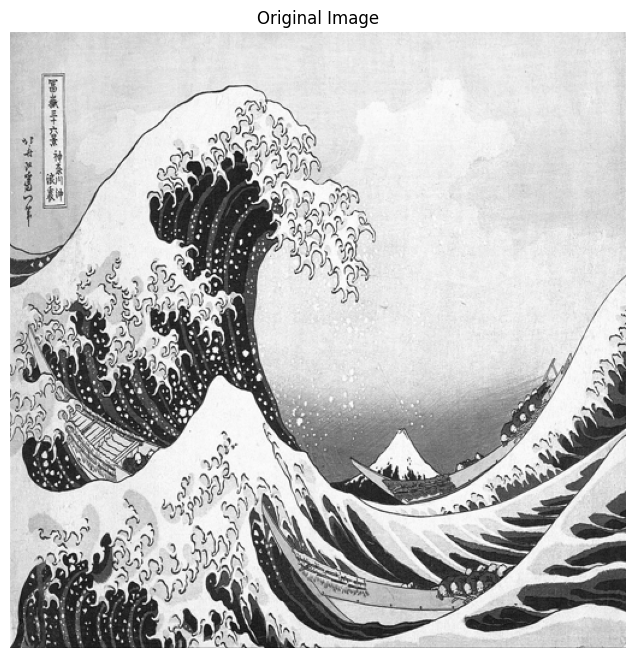

Original image shape: (512, 512)

Debugging edge_detection_parallel:
Return type: <class 'numpy.ndarray'>
Result shape: (512, 512)
Edge result shape: (512, 512)


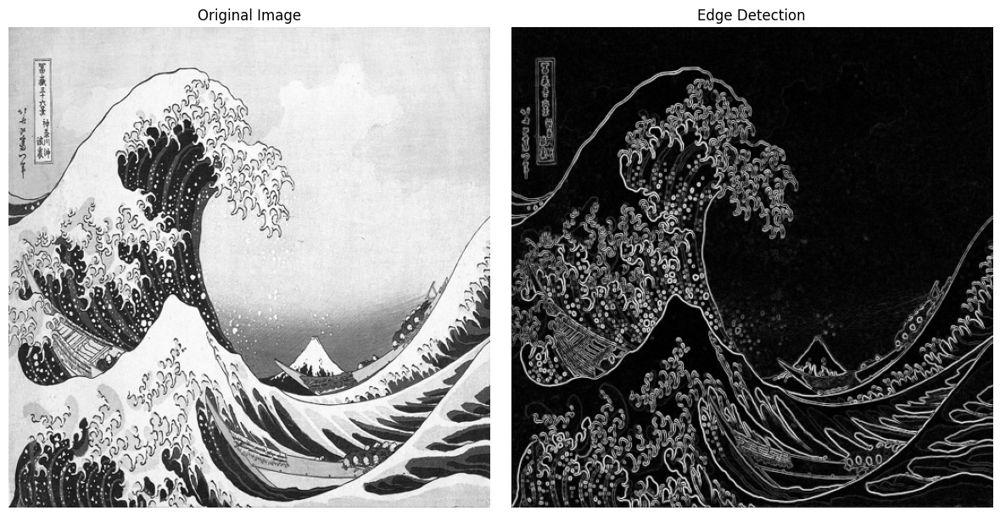


Testing blur_tensor:
Blur result type: <class 'numpy.ndarray'>
Blur result shape: (512, 512)


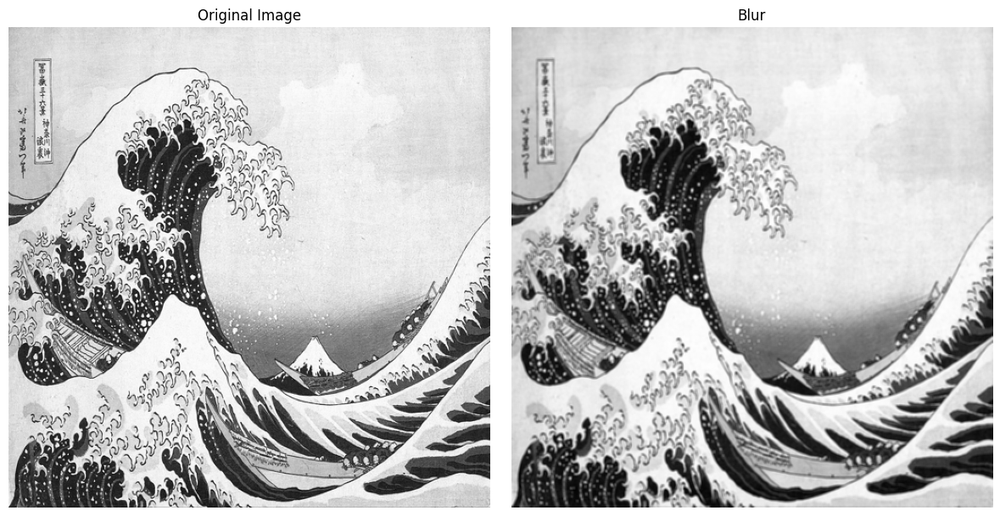


Testing sharpen_tensor:
Sharpen result type: <class 'numpy.ndarray'>
Sharpen result shape: (512, 512)


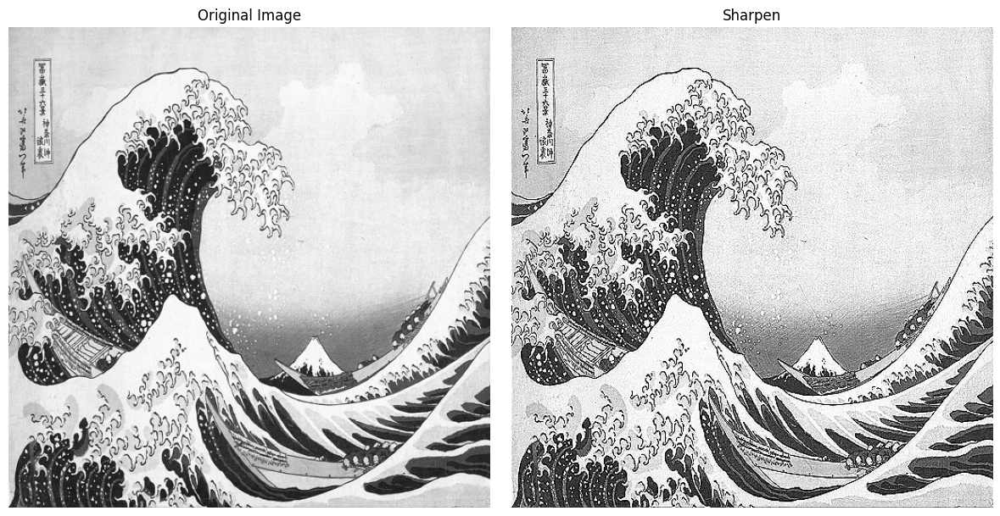

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
from io import BytesIO
import cupy as cp
import time

# Import your custom tensor operations library
from tensor_matrix_ops import TensorMatrixOps

# Download a test image
def load_image(url, size=(512, 512)):
    """Load an image from URL and resize it."""
    print(f"Loading image from {url}")
    with urllib.request.urlopen(url) as response:
        img = Image.open(BytesIO(response.read()))
    
    # Resize and convert to grayscale
    img = img.resize(size).convert('L')
    return np.array(img, dtype=np.float64) / 255.0

# Initialize the tensor operations
tensor_ops = TensorMatrixOps()

# Load a test image
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg"
original_image = load_image(url)

# Display the original image
plt.figure(figsize=(8, 8))
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

print(f"Original image shape: {original_image.shape}")

# Debug edge detection
print("\nDebugging edge_detection_parallel:")
result = tensor_ops.edge_detection_parallel(original_image)
print(f"Return type: {type(result)}")
if isinstance(result, tuple):
    print(f"Tuple length: {len(result)}")
    for i, item in enumerate(result):
        if hasattr(item, 'shape'):
            print(f"Item {i} type: {type(item)}, shape: {item.shape}")
        else:
            print(f"Item {i} type: {type(item)}, has no shape attribute")
else:
    print(f"Result shape: {getattr(result, 'shape', 'No shape attribute')}")

# Try to display the result
edge_result = None
if isinstance(result, tuple) and len(result) > 0:
    edge_result = result[0]
elif hasattr(result, 'shape'):
    edge_result = result

if edge_result is not None and hasattr(edge_result, 'shape'):
    print(f"Edge result shape: {edge_result.shape}")
    
    # Check if edge_result is 2D
    if len(edge_result.shape) == 2:
        plt.figure(figsize=(12, 6))
        plt.subplot(121)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
        
        plt.subplot(122)
        plt.imshow(edge_result, cmap='gray')
        plt.title("Edge Detection")
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    elif len(edge_result.shape) == 1:
        # Try to reshape it if it's the right size
        if edge_result.size == original_image.size:
            reshaped = edge_result.reshape(original_image.shape)
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(original_image, cmap='gray')
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(122)
            plt.imshow(reshaped, cmap='gray')
            plt.title("Edge Detection (Reshaped)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Cannot reshape edge result: size mismatch ({edge_result.size} vs {original_image.size})")
    else:
        print(f"Cannot display edge result: unsupported shape {edge_result.shape}")
else:
    print("No valid edge detection result to display")

# Test blur function
print("\nTesting blur_tensor:")
try:
    blur_result = tensor_ops.blur_tensor(original_image)
    print(f"Blur result type: {type(blur_result)}")
    print(f"Blur result shape: {getattr(blur_result, 'shape', 'No shape attribute')}")
    
    # Try to display the result
    if hasattr(blur_result, 'shape'):
        if len(blur_result.shape) == 2:
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(original_image, cmap='gray')
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(122)
            plt.imshow(blur_result, cmap='gray')
            plt.title("Blur")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
        elif len(blur_result.shape) == 1 and blur_result.size == original_image.size:
            reshaped = blur_result.reshape(original_image.shape)
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(original_image, cmap='gray')
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(122)
            plt.imshow(reshaped, cmap='gray')
            plt.title("Blur (Reshaped)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
    else:
        print("Cannot display blur result: no shape attribute")
except Exception as e:
    print(f"Error in blur_tensor: {e}")

# Test sharpen function
print("\nTesting sharpen_tensor:")
try:
    sharpen_result = tensor_ops.sharpen_tensor(original_image)
    print(f"Sharpen result type: {type(sharpen_result)}")
    print(f"Sharpen result shape: {getattr(sharpen_result, 'shape', 'No shape attribute')}")
    
    # Try to display the result
    if hasattr(sharpen_result, 'shape'):
        if len(sharpen_result.shape) == 2:
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(original_image, cmap='gray')
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(122)
            plt.imshow(np.clip(sharpen_result, 0, 1), cmap='gray')
            plt.title("Sharpen")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
        elif len(sharpen_result.shape) == 1 and sharpen_result.size == original_image.size:
            reshaped = sharpen_result.reshape(original_image.shape)
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(original_image, cmap='gray')
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(122)
            plt.imshow(reshaped, cmap='gray')
            plt.title("Sharpen (Reshaped)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
    else:
        print("Cannot display sharpen result: no shape attribute")
except Exception as e:
    print(f"Error in sharpen_tensor: {e}")

Initializing CUDA...
CUDA initialization complete
Function signatures configured
Loading image from https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg


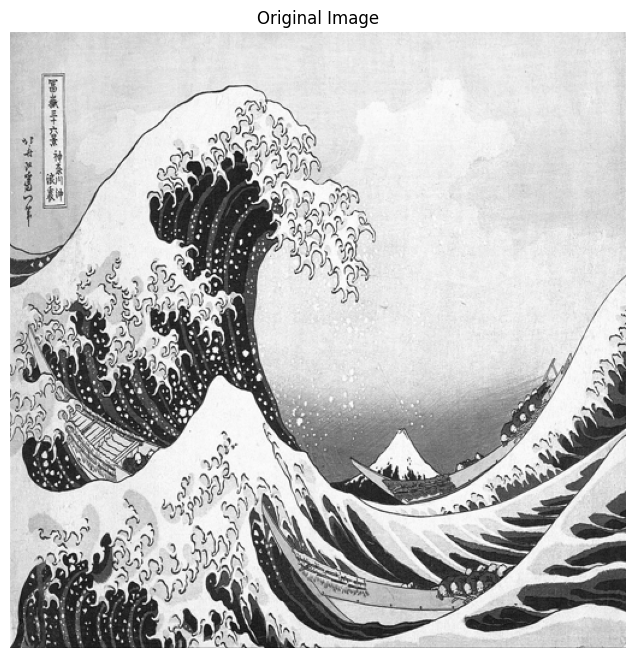

Running benchmarks with 3 trials for each operation...

1. Edge Detection Benchmark:
  Tensor Core Edge Detection: 0.0026s (avg of 3 trials)
  Original Edge Detection: 0.0028s (avg of 3 trials)
  CuPy Edge Detection: 0.0018s (avg of 3 trials)
  Speedup vs CuPy: 0.69x


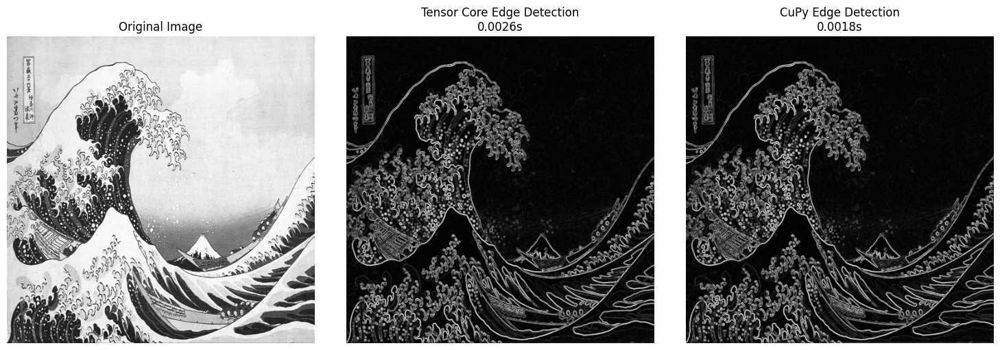


2. Blur Benchmark:
  Tensor Core Blur: 0.0020s (avg of 3 trials)
  CuPy Blur: 0.0040s (avg of 3 trials)
  Speedup vs CuPy: 1.99x


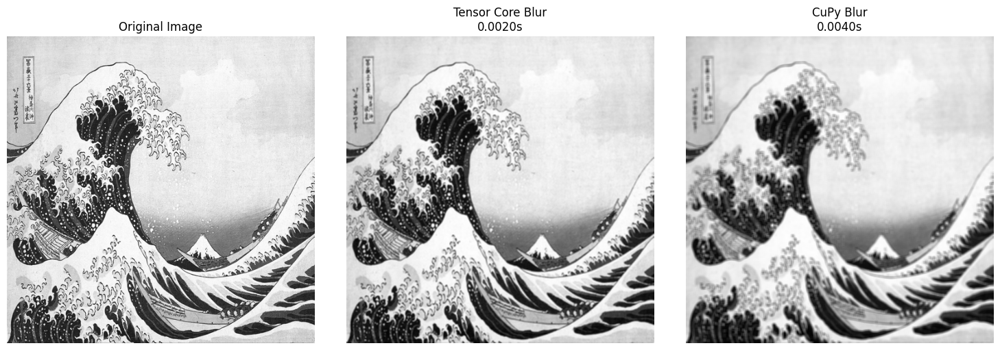


3. Sharpen Benchmark:
  Tensor Core Sharpen: 0.0023s (avg of 3 trials)
  CuPy Sharpen: 0.0007s (avg of 3 trials)
  Speedup vs CuPy: 0.31x


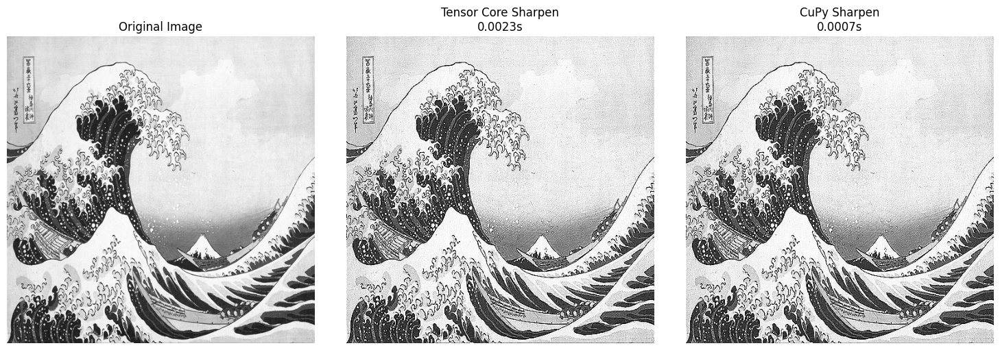


4. Multi-kernel Convolution Benchmark:
Using 3 identical kernels with shape: (5, 5, 3)
  Tensor Core Multi-kernel: 0.0074s (avg of 3 trials)
  CuPy Sequential Multi-kernel: 0.0070s (avg of 3 trials)
  Speedup vs CuPy: 0.95x


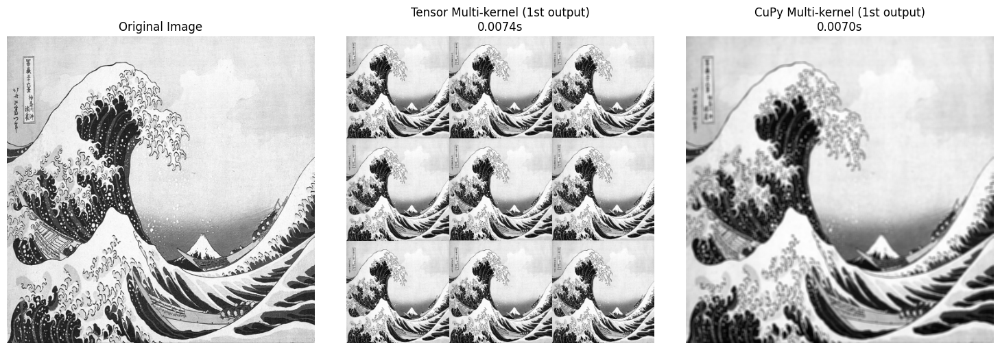


------ Performance Summary ------
Edge Detection:  Tensor 0.0026s | CuPy 0.0018s | Speedup: 0.69x
Blur:            Tensor 0.0020s | CuPy 0.0040s | Speedup: 1.99x
Sharpen:         Tensor 0.0023s | CuPy 0.0007s | Speedup: 0.31x
Multi-kernel:    Tensor 0.0074s | CuPy 0.0070s | Speedup: 0.95x


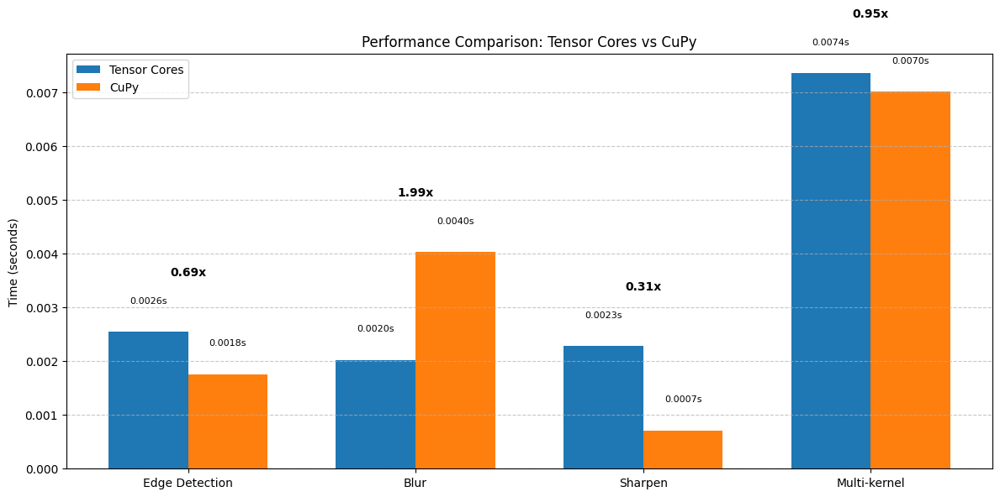

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
from io import BytesIO
import cupy as cp
import time
import cupyx.scipy.ndimage

# Import your custom tensor operations library
from tensor_matrix_ops import TensorMatrixOps

# Download a test image
def load_image(url, size=(512, 512)):
    """Load an image from URL and resize it."""
    print(f"Loading image from {url}")
    with urllib.request.urlopen(url) as response:
        img = Image.open(BytesIO(response.read()))
    
    # Resize and convert to grayscale
    img = img.resize(size).convert('L')
    return np.array(img, dtype=np.float64) / 255.0

# Function to safely get result from a tensor operation
def safe_get_result(result):
    """Extract the image result safely handling tuples and arrays."""
    if isinstance(result, tuple) and len(result) > 0:
        result = result[0]  # Take first element if tuple
    
    # Check shape and try to reshape if needed
    if hasattr(result, 'shape'):
        if len(result.shape) == 1:
            # Try to reshape to the right dimensions
            h, w = 512, 512  # Assuming default image size
            if result.size == h * w:
                return result.reshape(h, w)
        return result
    return None

# Initialize the tensor operations
tensor_ops = TensorMatrixOps()

# Load a test image
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg"
original_image = load_image(url)

# Display the original image
plt.figure(figsize=(8, 8))
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

# Define number of trials for benchmarking
NUM_TRIALS = 3
print(f"Running benchmarks with {NUM_TRIALS} trials for each operation...")

# Prepare for benchmark
img_cp = cp.asarray(original_image)

# 1. Edge Detection Benchmark
print("\n1. Edge Detection Benchmark:")
# Tensor Core method
tensor_times = []
for i in range(NUM_TRIALS):
    start_time = time.time()
    edge_result_raw = tensor_ops.edge_detection_parallel(original_image)
    edge_result = safe_get_result(edge_result_raw)
    tensor_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()  # Ensure GPU is done

avg_tensor_time = sum(tensor_times) / NUM_TRIALS
print(f"  Tensor Core Edge Detection: {avg_tensor_time:.4f}s (avg of {NUM_TRIALS} trials)")

# Backup method
parallel_times = []
for i in range(NUM_TRIALS):
    start_time = time.time()
    edge_result_parallel_raw = tensor_ops.edge_detection_tensor(original_image)
    edge_result_parallel = safe_get_result(edge_result_parallel_raw)
    parallel_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_parallel_time = sum(parallel_times) / NUM_TRIALS
print(f"  Original Edge Detection: {avg_parallel_time:.4f}s (avg of {NUM_TRIALS} trials)")

# CuPy reference
cupy_times = []
for i in range(NUM_TRIALS):
    start_time = time.time()
    sobel_x = cp.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=cp.float64)
    sobel_y = cp.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=cp.float64)
    grad_x = cupyx.scipy.ndimage.convolve(img_cp, sobel_x, mode='reflect')
    grad_y = cupyx.scipy.ndimage.convolve(img_cp, sobel_y, mode='reflect')
    edge_result_cupy = cp.sqrt(grad_x**2 + grad_y**2)
    edge_result_cupy = edge_result_cupy / cp.max(edge_result_cupy)
    edge_result_cupy_np = cp.asnumpy(edge_result_cupy)  # Include transfer back to CPU in timing
    cupy_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_cupy_time = sum(cupy_times) / NUM_TRIALS
print(f"  CuPy Edge Detection: {avg_cupy_time:.4f}s (avg of {NUM_TRIALS} trials)")
print(f"  Speedup vs CuPy: {avg_cupy_time/avg_tensor_time:.2f}x")

# Display results if we have valid outputs
if edge_result is not None and edge_result_cupy_np is not None:
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(edge_result, cmap='gray')
    plt.title(f"Tensor Core Edge Detection\n{avg_tensor_time:.4f}s")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(edge_result_cupy_np, cmap='gray')
    plt.title(f"CuPy Edge Detection\n{avg_cupy_time:.4f}s")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# 2. Blur Benchmark
print("\n2. Blur Benchmark:")
# Tensor Core method
blur_tensor_times = []
for i in range(NUM_TRIALS):
    start_time = time.time()
    blur_result_raw = tensor_ops.blur_tensor(original_image)
    blur_result = safe_get_result(blur_result_raw)
    blur_tensor_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_blur_tensor_time = sum(blur_tensor_times) / NUM_TRIALS
print(f"  Tensor Core Blur: {avg_blur_tensor_time:.4f}s (avg of {NUM_TRIALS} trials)")

# CuPy reference
blur_cupy_times = []
blur_kernel = np.ones((5, 5), dtype=np.float64) / 25.0
for i in range(NUM_TRIALS):
    start_time = time.time()
    blur_result_cupy = cupyx.scipy.ndimage.convolve(img_cp, cp.asarray(blur_kernel), mode='reflect')
    blur_result_cupy_np = cp.asnumpy(blur_result_cupy)
    blur_cupy_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_blur_cupy_time = sum(blur_cupy_times) / NUM_TRIALS
print(f"  CuPy Blur: {avg_blur_cupy_time:.4f}s (avg of {NUM_TRIALS} trials)")
print(f"  Speedup vs CuPy: {avg_blur_cupy_time/avg_blur_tensor_time:.2f}x")

# Display results
if blur_result is not None and blur_result_cupy_np is not None:
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(blur_result, cmap='gray')
    plt.title(f"Tensor Core Blur\n{avg_blur_tensor_time:.4f}s")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(blur_result_cupy_np, cmap='gray')
    plt.title(f"CuPy Blur\n{avg_blur_cupy_time:.4f}s")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# 3. Sharpen Benchmark
print("\n3. Sharpen Benchmark:")
# Tensor Core method
sharpen_tensor_times = []
for i in range(NUM_TRIALS):
    start_time = time.time()
    sharpen_result_raw = tensor_ops.sharpen_tensor(original_image)
    sharpen_result = safe_get_result(sharpen_result_raw)
    sharpen_tensor_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_sharpen_tensor_time = sum(sharpen_tensor_times) / NUM_TRIALS
print(f"  Tensor Core Sharpen: {avg_sharpen_tensor_time:.4f}s (avg of {NUM_TRIALS} trials)")

# CuPy reference
sharpen_cupy_times = []
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
], dtype=np.float64)
for i in range(NUM_TRIALS):
    start_time = time.time()
    sharpen_result_cupy = cupyx.scipy.ndimage.convolve(img_cp, cp.asarray(sharpen_kernel), mode='reflect')
    sharpen_result_cupy_np = cp.asnumpy(sharpen_result_cupy)
    sharpen_cupy_times.append(time.time() - start_time)
    cp.cuda.Stream.null.synchronize()

avg_sharpen_cupy_time = sum(sharpen_cupy_times) / NUM_TRIALS
print(f"  CuPy Sharpen: {avg_sharpen_cupy_time:.4f}s (avg of {NUM_TRIALS} trials)")
print(f"  Speedup vs CuPy: {avg_sharpen_cupy_time/avg_sharpen_tensor_time:.2f}x")

# Display results (clip sharpen results to 0-1 range for better visualization)
if sharpen_result is not None and sharpen_result_cupy_np is not None:
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(np.clip(sharpen_result, 0, 1), cmap='gray')
    plt.title(f"Tensor Core Sharpen\n{avg_sharpen_tensor_time:.4f}s")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(np.clip(sharpen_result_cupy_np, 0, 1), cmap='gray')
    plt.title(f"CuPy Sharpen\n{avg_sharpen_cupy_time:.4f}s")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# 4. Multi-kernel Convolution Benchmark
print("\n4. Multi-kernel Convolution Benchmark:")
try:
    # Create multiple different kernels
    blur_kernel = np.ones((5, 5), dtype=np.float64) / 25.0
    sharpen_kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ], dtype=np.float64)
    edge_kernel = np.array([
        [0, 1, 0],
        [1, -4, 1],
        [0, 1, 0]
    ], dtype=np.float64)
    
    # Use the identical kernel approach that worked previously
    kernels = np.stack([blur_kernel, blur_kernel, blur_kernel], axis=2)
    print(f"Using 3 identical kernels with shape: {kernels.shape}")
    
    # Tensor Core multi-kernel convolution
    multi_tensor_times = []
    for i in range(NUM_TRIALS):
        start_time = time.time()
        multi_result_raw = tensor_ops.multi_kernel_convolution(original_image, kernels)
        # For multi-kernel, we need to handle the 3D result differently
        if hasattr(multi_result_raw, 'shape') and len(multi_result_raw.shape) == 3:
            multi_result = multi_result_raw
        else:
            multi_result = None
        multi_tensor_times.append(time.time() - start_time)
        cp.cuda.Stream.null.synchronize()
    
    if multi_result is not None:
        avg_multi_tensor_time = sum(multi_tensor_times) / NUM_TRIALS
        print(f"  Tensor Core Multi-kernel: {avg_multi_tensor_time:.4f}s (avg of {NUM_TRIALS} trials)")
        
        # CuPy reference (sequential)
        multi_cupy_times = []
        for i in range(NUM_TRIALS):
            start_time = time.time()
            results = []
            for j in range(kernels.shape[2]):
                result = cupyx.scipy.ndimage.convolve(img_cp, cp.asarray(kernels[:,:,j]), mode='reflect')
                results.append(result)
            # Stack results
            cupy_results = cp.stack(results, axis=2)
            cupy_results_np = cp.asnumpy(cupy_results)
            multi_cupy_times.append(time.time() - start_time)
            cp.cuda.Stream.null.synchronize()
        
        avg_multi_cupy_time = sum(multi_cupy_times) / NUM_TRIALS
        print(f"  CuPy Sequential Multi-kernel: {avg_multi_cupy_time:.4f}s (avg of {NUM_TRIALS} trials)")
        print(f"  Speedup vs CuPy: {avg_multi_cupy_time/avg_multi_tensor_time:.2f}x")
        
        # Display results (just the first kernel output for simplicity)
        plt.figure(figsize=(15, 5))
        plt.subplot(131)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
        
        plt.subplot(132)
        plt.imshow(multi_result[:,:,0], cmap='gray')
        plt.title(f"Tensor Multi-kernel (1st output)\n{avg_multi_tensor_time:.4f}s")
        plt.axis('off')
        
        plt.subplot(133)
        plt.imshow(cupy_results_np[:,:,0], cmap='gray')
        plt.title(f"CuPy Multi-kernel (1st output)\n{avg_multi_cupy_time:.4f}s")
        plt.axis('off')
        plt.tight_layout()
        plt.show()
except Exception as e:
    print(f"Error in multi-kernel benchmark: {e}")

# Performance Summary
print("\n------ Performance Summary ------")
print(f"Edge Detection:  Tensor {avg_tensor_time:.4f}s | CuPy {avg_cupy_time:.4f}s | Speedup: {avg_cupy_time/avg_tensor_time:.2f}x")
print(f"Blur:            Tensor {avg_blur_tensor_time:.4f}s | CuPy {avg_blur_cupy_time:.4f}s | Speedup: {avg_blur_cupy_time/avg_blur_tensor_time:.2f}x")
print(f"Sharpen:         Tensor {avg_sharpen_tensor_time:.4f}s | CuPy {avg_sharpen_cupy_time:.4f}s | Speedup: {avg_sharpen_cupy_time/avg_sharpen_tensor_time:.2f}x")
if 'avg_multi_tensor_time' in locals():
    print(f"Multi-kernel:    Tensor {avg_multi_tensor_time:.4f}s | CuPy {avg_multi_cupy_time:.4f}s | Speedup: {avg_multi_cupy_time/avg_multi_tensor_time:.2f}x")

# Bar chart of performance comparison
operations = ["Edge Detection", "Blur", "Sharpen"]
tensor_times = [avg_tensor_time, avg_blur_tensor_time, avg_sharpen_tensor_time]
cupy_times = [avg_cupy_time, avg_blur_cupy_time, avg_sharpen_cupy_time]
if 'avg_multi_tensor_time' in locals():
    operations.append("Multi-kernel")
    tensor_times.append(avg_multi_tensor_time)
    cupy_times.append(avg_multi_cupy_time)

# Create bar chart
plt.figure(figsize=(12, 6))
x = np.arange(len(operations))
width = 0.35

plt.bar(x - width/2, tensor_times, width, label='Tensor Cores')
plt.bar(x + width/2, cupy_times, width, label='CuPy')

plt.ylabel('Time (seconds)')
plt.title('Performance Comparison: Tensor Cores vs CuPy')
plt.xticks(x, operations)
plt.legend()

# Add speedup labels
for i in range(len(operations)):
    speedup = cupy_times[i] / tensor_times[i]
    plt.text(i, max(cupy_times[i], tensor_times[i]) + 0.001, 
             f"{speedup:.2f}x", 
             ha='center', va='bottom', fontweight='bold')

# Add time labels to bars
for i, v in enumerate(tensor_times):
    plt.text(i - width/2, v + 0.0005, f"{v:.4f}s", ha='center', va='bottom', fontsize=8)
for i, v in enumerate(cupy_times):
    plt.text(i + width/2, v + 0.0005, f"{v:.4f}s", ha='center', va='bottom', fontsize=8)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Clean up memory
cp.get_default_memory_pool().free_all_blocks()

Initializing CUDA...
CUDA initialization complete
Function signatures configured
Available methods in TensorMatrixOps:
- add_tensor_convolution_methods
- batched_matmul
- batched_vector_matmul
- blur_tensor
- compare_implementations
- device
- edge_detection_parallel
- edge_detection_tensor
- lib
- matmul
- matmul_vector
- matrix_dot
- matrix_power
- mempool
- multi_kernel_convolution
- parallel_tensor_5d_matmul
- pinned_mempool
- sharpen_tensor
- stream
- strided_batch_matmul
- tensor_4d_matmul
- tensor_5d_matmul
- vector_matmul

Loading image from https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg


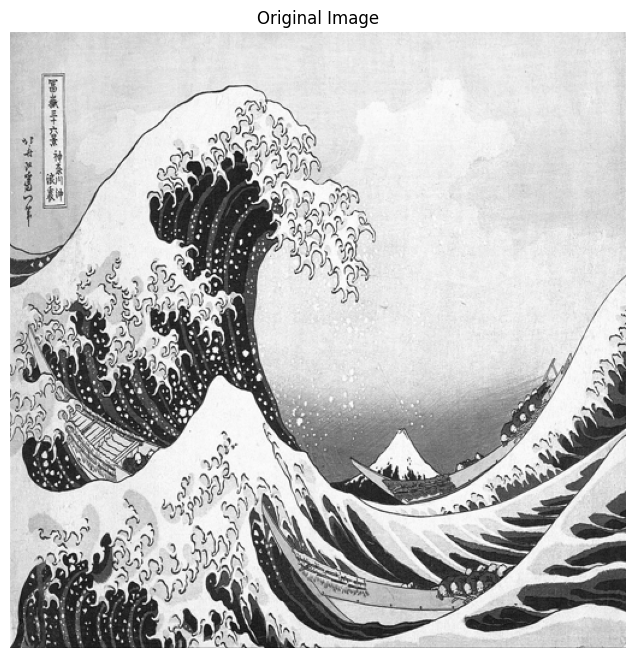

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
from io import BytesIO
import cupy as cp
import time
import inspect

# Import your custom tensor operations library
from tensor_matrix_ops import TensorMatrixOps

# Initialize the tensor operations
tensor_ops = TensorMatrixOps()

# Check available methods
print("Available methods in TensorMatrixOps:")
methods = [method for method in dir(tensor_ops) if not method.startswith('_')]
for method in methods:
    print(f"- {method}")

# Load a test image
def load_image(url, size=(512, 512)):
    """Load an image from URL and resize it."""
    print(f"\nLoading image from {url}")
    with urllib.request.urlopen(url) as response:
        img = Image.open(BytesIO(response.read()))
    
    # Resize and convert to grayscale
    img = img.resize(size).convert('L')
    return np.array(img, dtype=np.float64) / 255.0

url = "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg"
original_image = load_image(url)

# Display the original image
plt.figure(figsize=(8, 8))
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()
